In [1]:
import os

import cv2
import numpy as np
import pandas as pd
import fiftyone as fo
from tqdm import tqdm

from pathlib import Path

import matplotlib.pyplot as plt

In [2]:
if fo.dataset_exists('worker_1'):
    fo.delete_dataset('worker_1')

if fo.dataset_exists('worker_2'):
    fo.delete_dataset('worker_2')

if fo.dataset_exists('worker_3'):
    fo.delete_dataset('worker_3')

In [3]:
base_label_dir = '../data/labeled_tasks'

worker_1_dataset = dataset = fo.Dataset.from_dir(
    dataset_type=fo.types.COCODetectionDataset,
    data_path=f'{base_label_dir}/worker_1/data',
    labels_path=f'{base_label_dir}/worker_1/labels.json',
    name='worker_1',
)

worker_2_dataset = dataset = fo.Dataset.from_dir(
    dataset_type=fo.types.COCODetectionDataset,
    data_path=f'{base_label_dir}/worker_2/data',
    labels_path=f'{base_label_dir}/worker_2/labels.json',
    name='worker_2',
)

worker_3_dataset = dataset = fo.Dataset.from_dir(
    dataset_type=fo.types.COCODetectionDataset,
    data_path=f'{base_label_dir}/worker_3/data',
    labels_path=f'{base_label_dir}/worker_3/labels.json',
    name='worker_3',
)

 100% |█████████████████| 533/533 [386.3ms elapsed, 0s remaining, 1.4K samples/s]     
 100% |█████████████████| 512/512 [340.6ms elapsed, 0s remaining, 1.5K samples/s]     
 100% |█████████████████| 535/535 [369.4ms elapsed, 0s remaining, 1.5K samples/s]     


In [4]:
def visualize_labels(dataset):
    fig = plt.figure(figsize=(21, 9))

    _, axes = plt.subplots(3, 3, figsize=(16, 16))
    axes = axes.flatten()
    
    for sample, ax in zip(dataset.take(9, 3), axes):
        img = cv2.imread(sample.filepath)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        if sample.detections:
            detection = sample.detections.detections[0]
    
            x, y, w, h = detection.bounding_box
            height, width = img.shape[:2]
            x1 = int(x * width)
            y1 = int(y * height)
            x2 = int((x + w) * width)
            y2 = int((y + h) * height)
    
            img = cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0))
        
        ax.imshow(img)
        ax.axis('off')

<Figure size 2100x900 with 0 Axes>

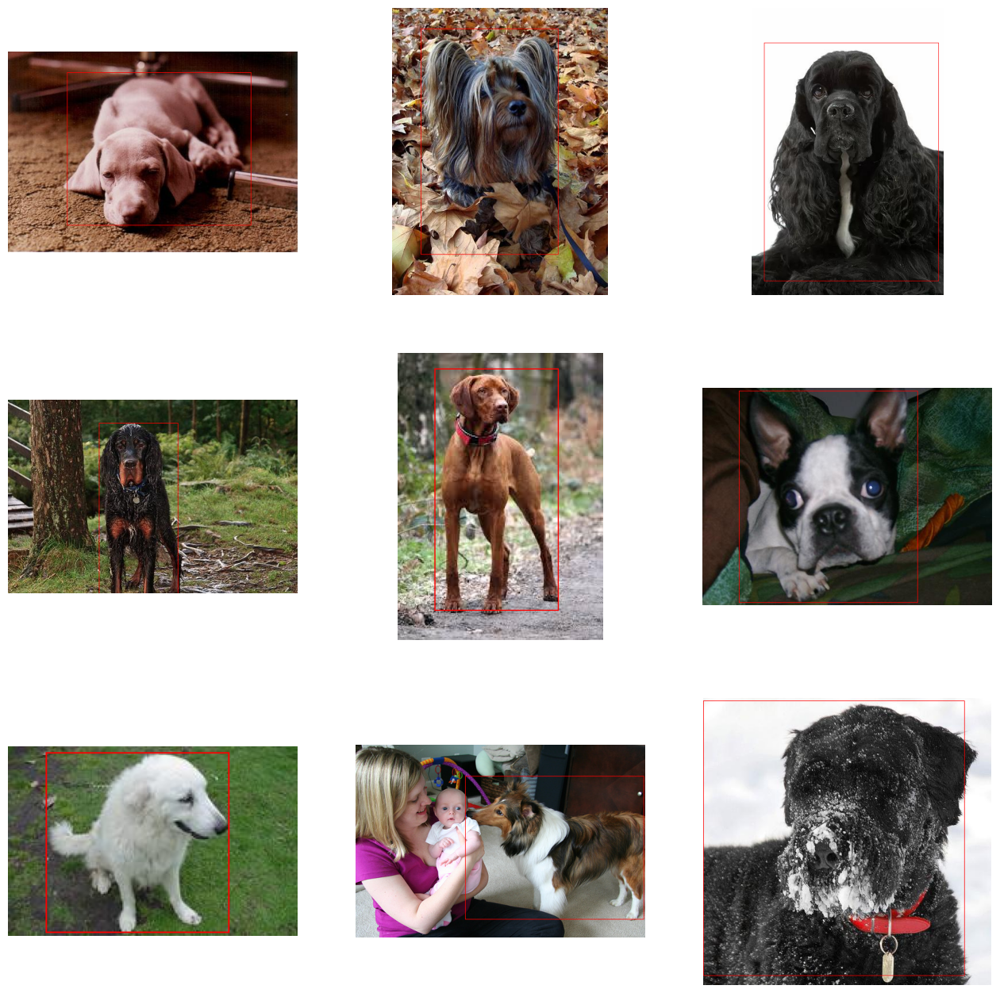

In [5]:
visualize_labels(worker_1_dataset)

<Figure size 2100x900 with 0 Axes>

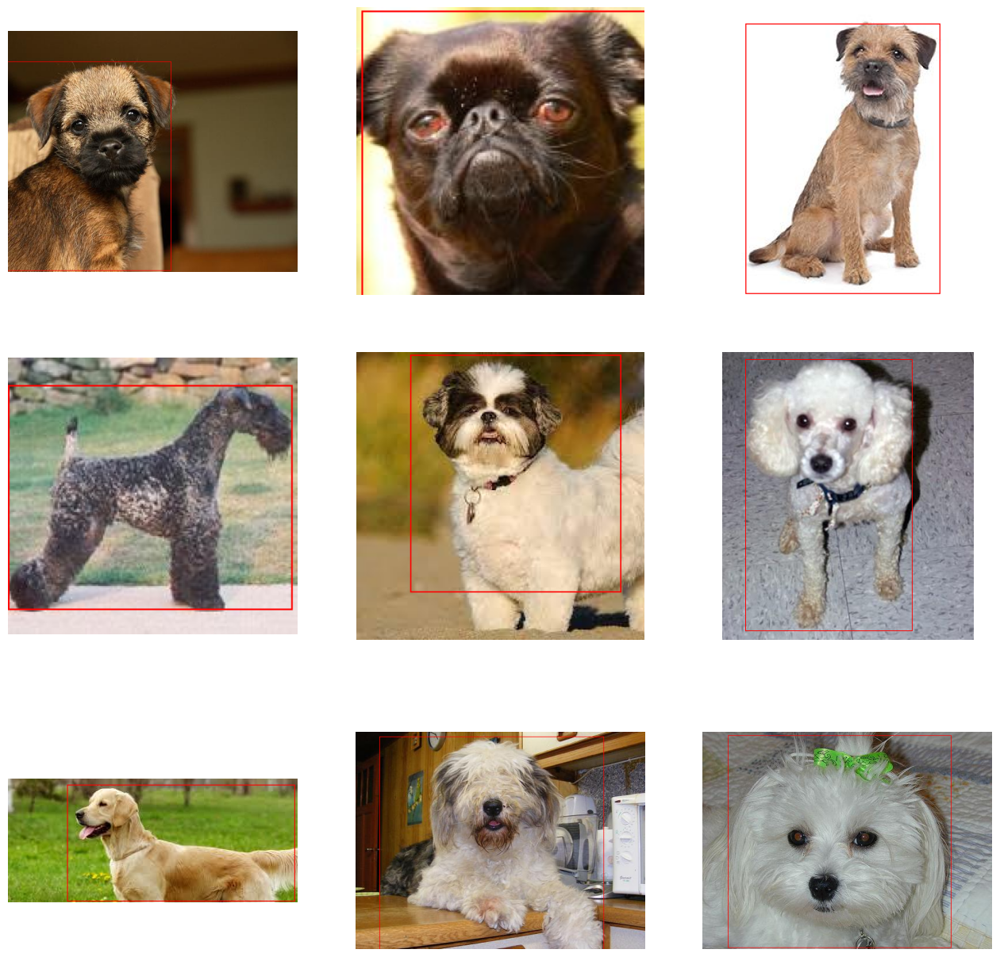

In [6]:
visualize_labels(worker_2_dataset)

<Figure size 2100x900 with 0 Axes>

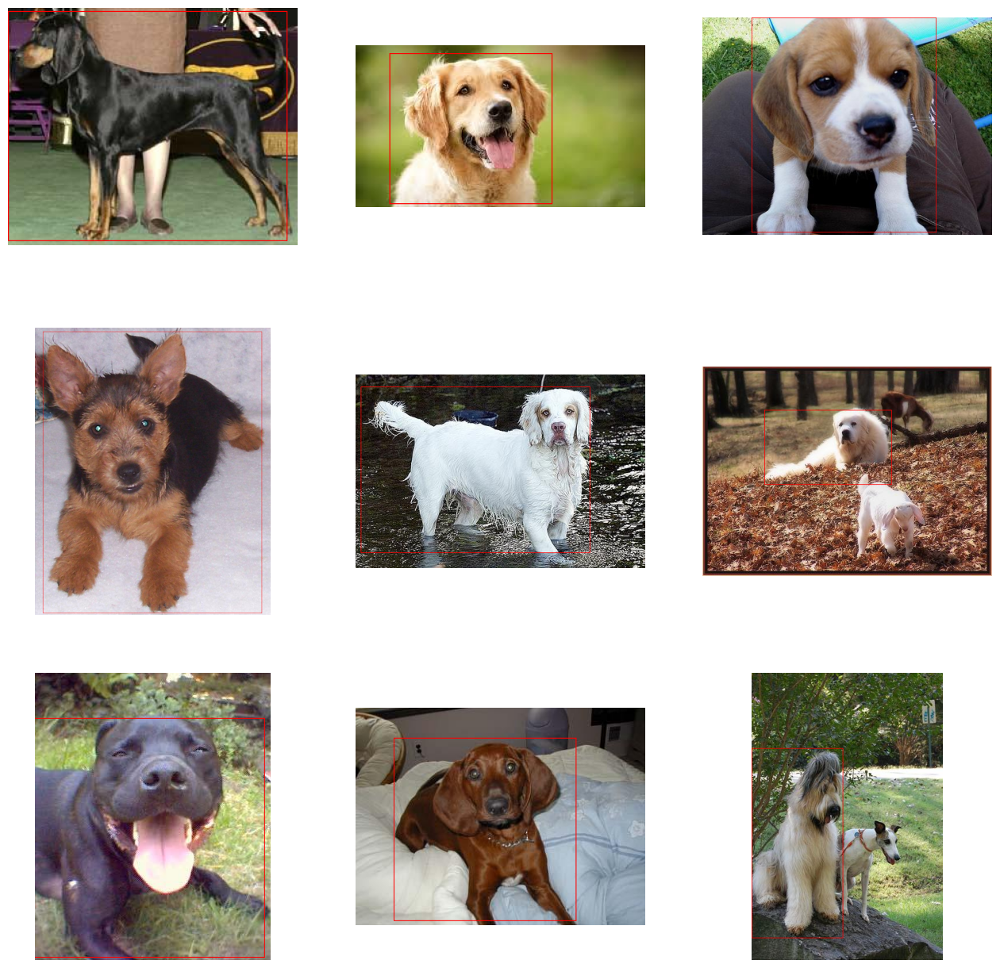

In [7]:
visualize_labels(worker_3_dataset)

## Проверим соблюдение правила об одном объекте

In [8]:
def check_that_object_is_one(dataset):
    corr_labels = 0
    unlabeled = 0

    for sample in dataset:
        if sample.detections:
            corr_labels += int(len(sample.detections.detections) == 1)
        else:
            unlabeled += 1

    return corr_labels / len(dataset), unlabeled / len(dataset)

In [9]:
corr_rate, unlabeled_rate = check_that_object_is_one(worker_1_dataset)

print('Статистика для разметчика №1')
print(f'Доля размеченных изображений с 1 объектом: {round(corr_rate, 3)}')
print(f'Доля неразмеченных изображений: {round(unlabeled_rate, 3)}')
print(f'Доля изображений с более чем 1 объектом: {round(1 - corr_rate - unlabeled_rate, 3)}')

Статистика для разметчика №1
Доля размеченных изображений с 1 объектом: 0.968
Доля неразмеченных изображений: 0.021
Доля изображений с более чем 1 объектом: 0.011


In [10]:
corr_rate, unlabeled_rate = check_that_object_is_one(worker_2_dataset)

print('Статистика для разметчика №2')
print(f'Доля размеченных изображений с 1 объектом: {round(corr_rate, 3)}')
print(f'Доля неразмеченных изображений: {round(unlabeled_rate, 3)}')
print(f'Доля изображений с более чем 1 объектом: {round(1 - corr_rate - unlabeled_rate, 3)}')

Статистика для разметчика №2
Доля размеченных изображений с 1 объектом: 1.0
Доля неразмеченных изображений: 0.0
Доля изображений с более чем 1 объектом: 0.0


In [11]:
corr_rate, unlabeled_rate = check_that_object_is_one(worker_3_dataset)

print('Статистика для разметчика №3')
print(f'Доля размеченных изображений с 1 объектом: {round(corr_rate, 3)}')
print(f'Доля неразмеченных изображений: {round(unlabeled_rate, 3)}')
print(f'Доля изображений с более чем 1 объектом: {round(1 - corr_rate - unlabeled_rate, 3)}')

Статистика для разметчика №3
Доля размеченных изображений с 1 объектом: 0.963
Доля неразмеченных изображений: 0.019
Доля изображений с более чем 1 объектом: 0.019


#### Выводы по соблюдению правил разметки
В целом разметчики достаточно хорошо справились с заданием в плане соблюдения правил, наилучшим образом справился разметчик №2, который соблюдал все рекоменации: не размечать более 1 объекта и удалять лишние примеры. Разметчики №1 и 3 справились похуже. Они пропускали изображения (может из-за того что просто допустили ошибку, а может просто забыли, что их можно было удалять).

P.S. позже выяснилось, что они не знали, что их тоже надо удалять (инструкция обновлена)

## Чистка разметки

In [12]:
def delete_wrong_samples(dataset):
    for sample in dataset:
        if not sample.detections or len(sample.detections.detections) != 1:
            dataset.delete_samples([sample])

In [13]:
delete_wrong_samples(worker_1_dataset)
delete_wrong_samples(worker_2_dataset)
delete_wrong_samples(worker_3_dataset)

## Подсчёт согласованности разметчиков

Для подсчёта согласованности разметки будем измерять IOU между разметчиками на общих изображениях, которые они размечали

In [14]:
def convert_bbox_to_xyxy(box, width, height):
    x, y, w, h = box

    x1 = int(x * width)
    y1 = int(y * height)
    x2 = int((x + w) * width)
    y2 = int((y + h) * height)

    return [x1, y1, x2, y2]


def calculate_iou(left_bbox, right_bbox):
    x_left = max(left_bbox[0], right_bbox[0])
    y_top = max(left_bbox[1], right_bbox[1])
    x_right = min(left_bbox[2], right_bbox[2])
    y_bottom = min(left_bbox[3], right_bbox[3])
    
    if x_right < x_left or y_bottom < y_top:
        return 0
    
    intersection_area = (x_right - x_left) * (y_bottom - y_top)
    
    box1_area = (left_bbox[2] - left_bbox[0]) * (left_bbox[3] - left_bbox[1])
    box2_area = (right_bbox[2] - right_bbox[0]) * (right_bbox[3] - right_bbox[1])
    union_area = box1_area + box2_area - intersection_area + 1e-6
    
    iou = intersection_area / union_area
    
    return iou


def calculate_IOU_for_labelers_and_plot(left_path_to_sample, right_path_to_sample):
    same_keys = set(left_path_to_sample.keys()).intersection(set(right_path_to_sample.keys()))

    iou_val_list = []

    if len(same_keys) == 0:
        raise ValueError('No common labels')

    for key in same_keys:
        left_bbox = left_path_to_sample[key].detections.detections[0].bounding_box
        right_bbox = right_path_to_sample[key].detections.detections[0].bounding_box

        width = left_path_to_sample[key].metadata.width
        height = left_path_to_sample[key].metadata.height

        iou_val_list.append(
            calculate_iou(
                convert_bbox_to_xyxy(left_bbox, width, height),
                convert_bbox_to_xyxy(right_bbox, width, height),
            )
        )

    _, axes = plt.subplots(1, 3, figsize=(16, 16))
    axes = axes.flatten()
    
    for ax, key in zip(axes, sorted(list(same_keys))[:3]):
        img = cv2.imread(left_path_to_sample[key].filepath)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        left_bbox = left_path_to_sample[key].detections.detections[0].bounding_box
        right_bbox = right_path_to_sample[key].detections.detections[0].bounding_box

        width = left_path_to_sample[key].metadata.width
        height = left_path_to_sample[key].metadata.height

        left_bbox = convert_bbox_to_xyxy(left_bbox, width, height)
        right_bbox = convert_bbox_to_xyxy(right_bbox, width, height)

        iou = calculate_iou(left_bbox, right_bbox)

        img = cv2.rectangle(img, (left_bbox[0], left_bbox[1]), (left_bbox[2], left_bbox[3]), (255, 0, 0), 2)
        img = cv2.rectangle(img, (right_bbox[0], right_bbox[1]), (right_bbox[2], right_bbox[3]), (0, 0, 255), 2)
        
        ax.imshow(img)
        ax.set_title(f'IOU = {round(iou, 3)}')
        ax.axis('off')

    plt.show()

    return iou_val_list

In [15]:
first_path_to_sample = {Path(item.filepath).name: item for item in worker_1_dataset}
second_path_to_sample = {Path(item.filepath).name: item for item in worker_2_dataset}
third_path_to_sample = {Path(item.filepath).name: item for item in worker_3_dataset}

Красный цвет - разметчик №1, Синий цвет - разметчик №2


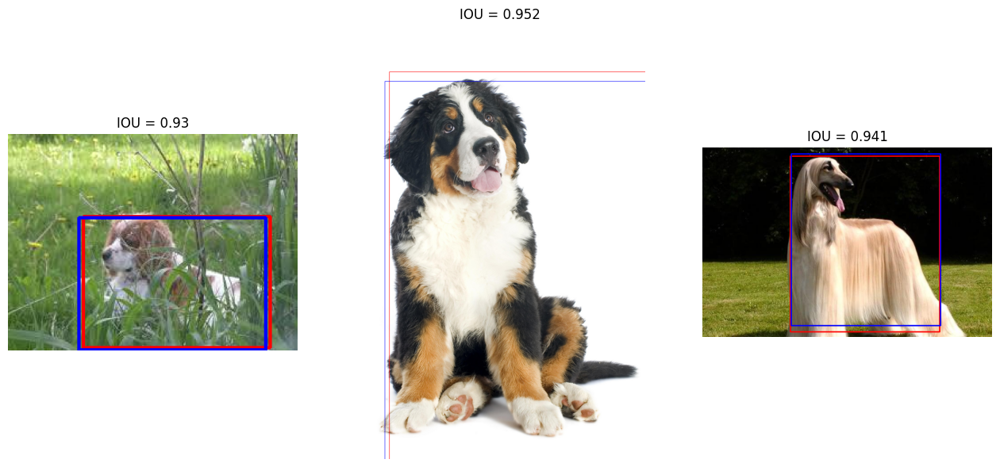

In [16]:
print('Красный цвет - разметчик №1, Синий цвет - разметчик №2')
first_second_workers_iou = calculate_IOU_for_labelers_and_plot(first_path_to_sample, second_path_to_sample)

Красный цвет - разметчик №1, Синий цвет - разметчик №3


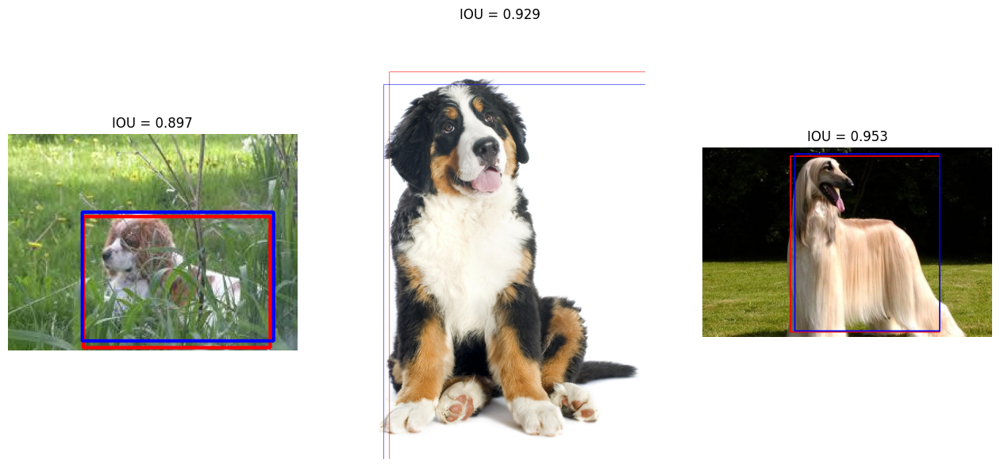

In [17]:
print('Красный цвет - разметчик №1, Синий цвет - разметчик №3')
first_third_workers_iou = calculate_IOU_for_labelers_and_plot(first_path_to_sample, third_path_to_sample)

Красный цвет - разметчик №2, Синий цвет - разметчик №3


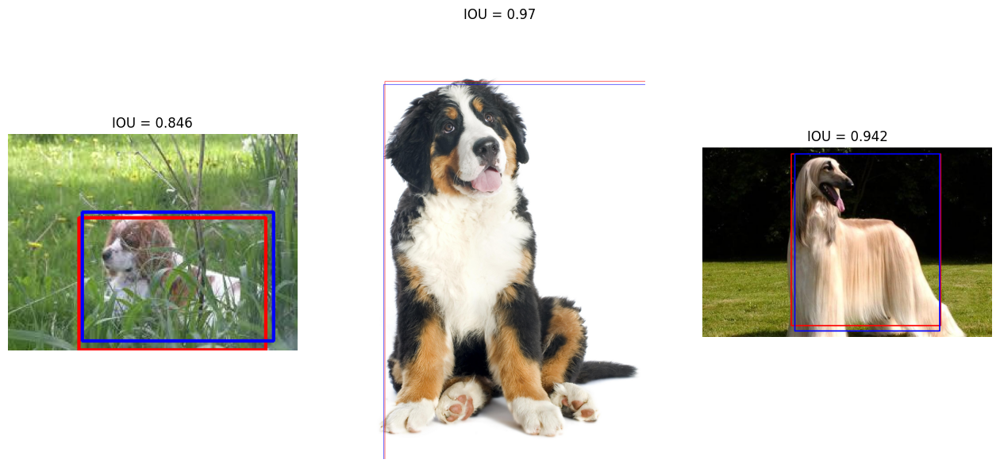

In [18]:
print('Красный цвет - разметчик №2, Синий цвет - разметчик №3')
second_third_workers_iou = calculate_IOU_for_labelers_and_plot(second_path_to_sample, third_path_to_sample)

In [19]:
import numpy as np

In [20]:
print(f'Согласованность 1 и 2 разметчика по IOU: {round(np.mean(first_second_workers_iou), 3)}')
print(f'Согласованность 1 и 3 разметчика по IOU: {round(np.mean(first_third_workers_iou), 3)}')
print(f'Согласованность 2 и 3 разметчика по IOU: {round(np.mean(second_third_workers_iou), 3)}')

Согласованность 1 и 2 разметчика по IOU: 0.927
Согласованность 1 и 3 разметчика по IOU: 0.928
Согласованность 2 и 3 разметчика по IOU: 0.924


In [21]:
same_count = (np.array(first_second_workers_iou) > 0.9).sum()
print(f'Кол-во совпадающих случаев в разметке 1 и 2 разметчиков: {same_count} ({round(same_count / len(first_second_workers_iou) * 100, 2)}%)')

Кол-во совпадающих случаев в разметке 1 и 2 разметчиков: 97 (75.78%)


In [22]:
same_count = (np.array(first_third_workers_iou) > 0.9).sum()
print(f'Кол-во совпадающих случаев в разметке 1 и 3 разметчиков: {same_count} ({round(same_count / len(first_third_workers_iou) * 100, 2)}%)')

Кол-во совпадающих случаев в разметке 1 и 3 разметчиков: 102 (79.69%)


In [23]:
same_count = (np.array(second_third_workers_iou) > 0.9).sum()
print(f'Кол-во совпадающих случаев в разметке 2 и 3 разметчиков: {same_count} ({round(same_count / len(second_third_workers_iou) * 100, 2)}%)')

Кол-во совпадающих случаев в разметке 2 и 3 разметчиков: 103 (80.47%)


#### Выводы по согласованности разметчиков
Разметка от трёх разметчиков является достаточно согласованной. В среднем показатели согласованности колеблются на уровне 92 IOU. Наиболее согласованными являются 1 и 3 разметчики, тк число совпадающих в разметке случаев у них наибольшее. В принципе этого и следовало ожидать, тк задача не очень сложная.

## Подсчёт метрик на Honeypot'ах

In [24]:
dataset_name = "dogs-dataset"

if fo.dataset_exists(dataset_name):
    fo.delete_dataset(dataset_name)

print(f"Creating new dataset: {dataset_name}")
gt_dataset = fo.Dataset.from_dir(
    dataset_type=fo.types.COCODetectionDataset,
    data_path='../data/deduplicated-dataset/data/',
    labels_path='../data/deduplicated-dataset/labels.json',
    name=dataset_name,
)
gt_labels_to_samples = {Path(item.filepath).name: item for item in gt_dataset}

Creating new dataset: dogs-dataset
 100% |█████████████| 32306/32306 [20.6s elapsed, 0s remaining, 3.0K samples/s]      


In [25]:
def plot_graph_for_metrics_analysis(metrics_val):
    plt.figure(figsize=(12, 6))

    mean_iou = np.mean(metrics_val)

    freq, bins, _ = plt.hist(metrics_val, bins=100)
    plt.vlines(mean_iou, 0, max(freq), colors=['red'], label=f'Mean iou = {round(mean_iou, 3)}')
    plt.legend()

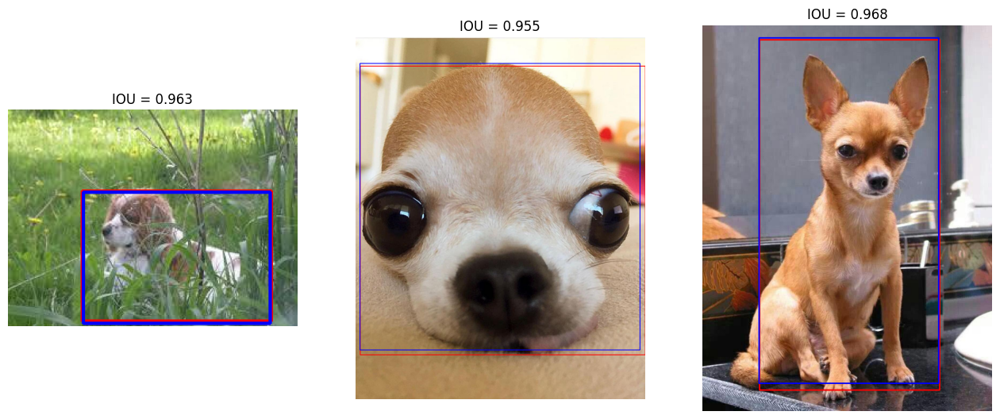

In [26]:
first_ious = calculate_IOU_for_labelers_and_plot(gt_labels_to_samples, first_path_to_sample)

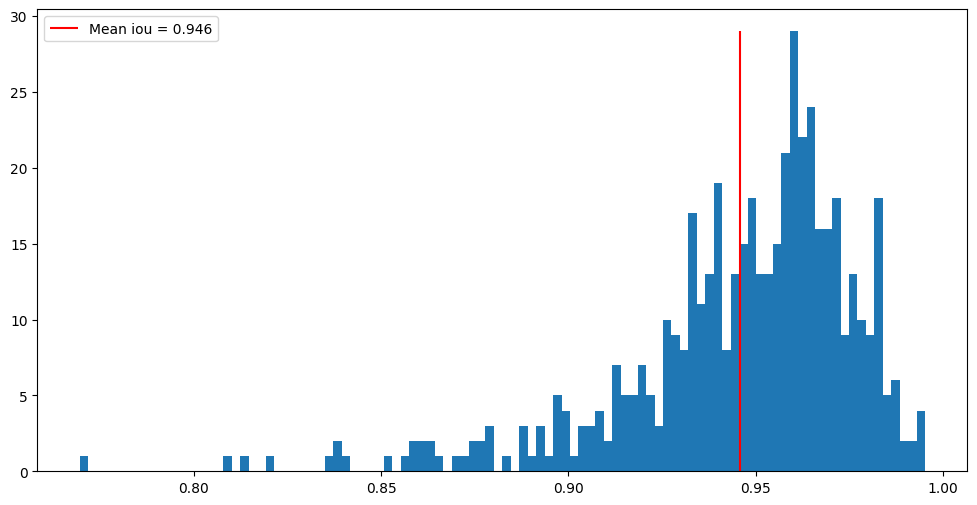

In [27]:
plot_graph_for_metrics_analysis(first_ious)

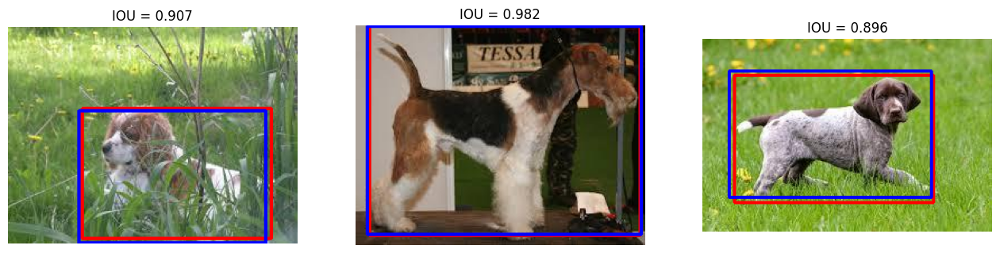

In [28]:
second_ious = calculate_IOU_for_labelers_and_plot(gt_labels_to_samples, second_path_to_sample)

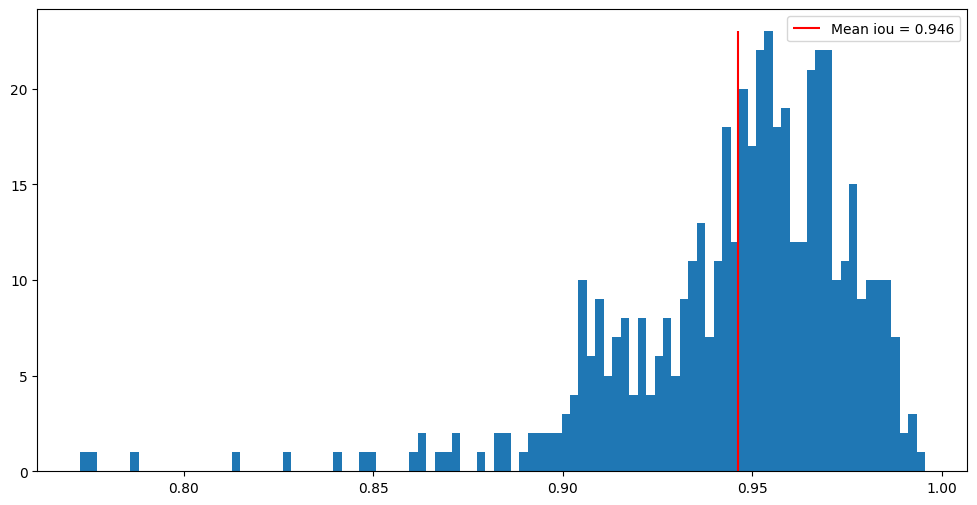

In [29]:
plot_graph_for_metrics_analysis(second_ious)

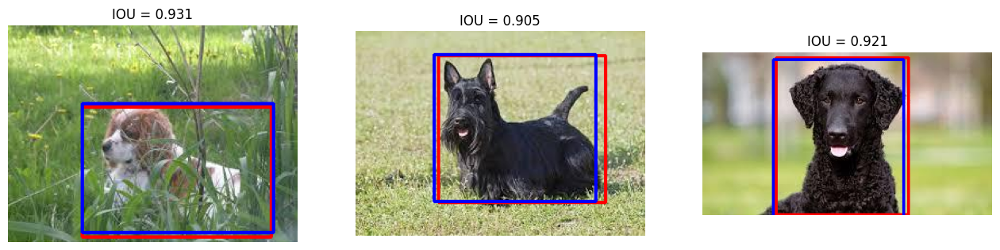

In [30]:
third_ious = calculate_IOU_for_labelers_and_plot(gt_labels_to_samples, third_path_to_sample)

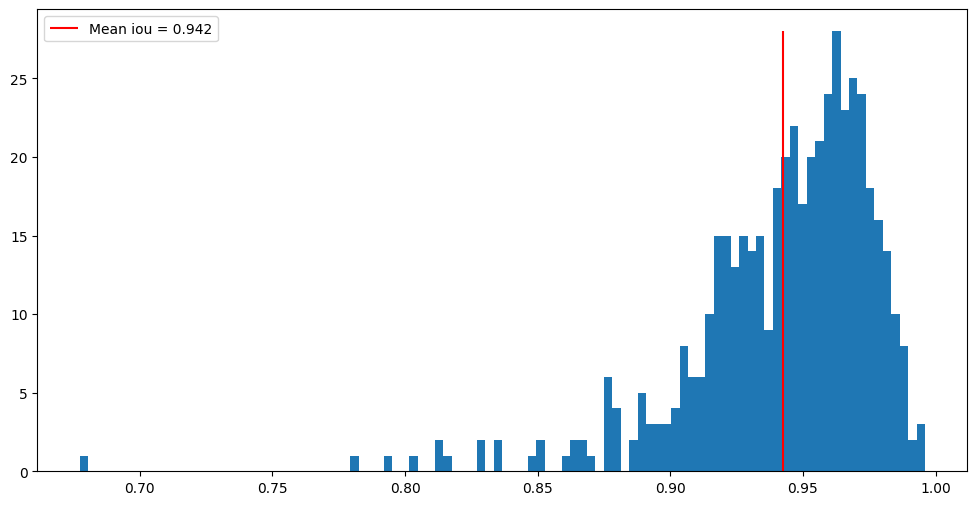

In [31]:
plot_graph_for_metrics_analysis(third_ious)

### Выводы по метрикам
Все разметчики хорошо справились с задачей, их средний IOU относительно разметки равен 0.94. Однако можно заметить, что у распределений достаточно тяжёлый левый хвост, что говорит о невнимательности разметчиков на каких-то сэмплах.
Во время разговора выяснилось, что нагрузка на них была слишком большой, что могло привести к данным искажениям, следовательно лучше сделать батчи для разметки более мелкими и увеличить число разметчиков или времени, чтобы снизить индивидуальную дневную нагрузку.